### This notebook covers the following:
* ### Estimating Green Cover using Vegetation Indexes
* ### Timelapse for Normalized Difference Vegetation Index (NDVI)
* ### Time series graphical analysis representing Vegetation Indexes (NDVI & EVI) for Maharashtra state
* ### Lancover Analysis of Kolkata, India
* ### Analysing Air Quality of KOlkata

In [43]:
# !pip install geemap
# !pip install ipygee
# !pip install proplot

In [44]:
import ee
# Trigger the authentication flow.
# ee.Authenticate()

# Initialize the library.
ee.Initialize()

In [45]:
import geemap
import ipywidgets as widgets
import numpy as np
import pandas as pd
import proplot as plot 
import matplotlib.pyplot as plt 
from ipygee import chart
from pandas.plotting import register_matplotlib_converters

#Estimating Green Cover using Vegetation Indexes
---

**Dataset Used: Sentinal 2A  Surface Reflectance**

*   **Normalised Difference Vegetation Index (NDVI):** The most commonly used remote sensing index that calculates the ratio of the difference and sum between the Near Infrared and Red bands of multispectral images. It normally takes values between -1 and +1. It is mostly used in vegetation dynamics monitoring, including biomass quantification.

*   **Enhanced Vegetation Index (EVI):** Very similar to NDVI. The only difference is that it corrects atmospheric and canopy background noise, particularly in regions with high biomass.

Acoording to the dataset chosen, the formula of the vegetation indexes will be as follows:

*   *NDVI = (Band 8 – Band 4) / (Band 8 + Band 4)*
*   *EVI = 2.5 * ((Band 8 – Band 4) / (Band 8 + 6 * Band 4 – 7.5 * Band 2 + 1))*





In [46]:
style = {'description_width': 'initial'}

year = widgets.IntSlider(description='Select Year:', value=2017, min=2017, max=2024, style=style)
month = widgets.IntSlider(description='Select Month:', value=5, min=1, max=12, style=style)
hbox = widgets.HBox([year, month])

In [47]:
add_layer = widgets.Button(
    description='Add Layer',
    button_style='primary',
    tooltip='Click to add layer',
    style=style
)

output1 = widgets.Output()

hbox2 = widgets.HBox([add_layer])

In [48]:
map = geemap.Map(center=[23.5121, 80.3288], zoom=5)

def submit_check(b):
    
    with output1:
        output1.clear_output()
            
        start_date = str(year.value)+ '-' + str(month.value).zfill(2) + '-01'
        end_date = str(year.value)+ '-' + str(month.value).zfill(2) + '-30'
        
        print('Computing...')
        image = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED").filterDate(start_date, end_date).min()
        nir = image.select('B8')
        red = image.select('B4')
        ndvi = nir.subtract(red).divide(nir.add(red)).rename('NDVI')
        ndviParams = {'min': -1, 'max': 1, 'palette': ['blue', 'white', 'green']}
        evi = image.expression(
            '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))', {
            'NIR': image.select('B8'),
            'RED': image.select('B4'),
            'BLUE': image.select('B2')
        })
        eviParams = {'min': -1, 'max': 1, 'palette': ['blue', 'white', 'green']}
        map.addLayer(ndvi, ndviParams, 'NDVI image')
        map.addLayer(evi, eviParams, 'EVI image')
        print(type(map))

add_layer.on_click(submit_check)

In [49]:
output1

Output()

**Steps to interpret and interact with the Map:**
1. The rendered map is pannable and zoomable, use it accordingly

2. Click on the globe icon (located top-left) to search and mark a specific location

3.   A darker shade of green represents more vegetation and lighter or blue shade represents less or no vegetation respectively

4.   Click on the toolbar on the top-right corner and select layers to switch between layers (NDVI, NVI and google maps). 

5.   Use the slider alongside to adjust the opacity

6. Select the year(Y) and month(M) to get the repective map for that month (01-MM-YYYY to 30-MM-YYYY)


In [50]:
hbox

In [51]:
hbox2

In [52]:
map

Map(center=[23.5121, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(chi…

# Timelapse for Normalized Difference Vegetation Index (NDVI)
---

In [53]:
map2 = geemap.Map(center=[23.5121, 80.3288], zoom=5)

start_year = widgets.IntSlider(description='Start Year:', value=2017, min=2017, max=2024, style=style)
end_year = widgets.IntSlider(description='End Year:', value=2017, min=2017, max=2024, style=style)
start_month = widgets.IntSlider(description='Start Month:', value=1, min=1, max=12, style=style)
end_month = widgets.IntSlider(description='End Month:', value=1, min=1, max=12, style=style)
dropdown = widgets.Dropdown(
    options=['NDVI'],
    value='NDVI',
    description='Index:'
)
hbox3 = widgets.HBox([start_year, end_year, start_month, end_month, dropdown])

In [54]:
create_gif = widgets.Button(
    description='Create timelapse',
    button_style='primary',
    tooltip='Click to create timelapse',
    style=style
)

download_gif = widgets.Button(
    description='Download GIF',
    button_style='primary',
    tooltip='Click to download timelapse',
    disabled=False,
    style=style
)

output = widgets.Output()

hbox5 = widgets.HBox([create_gif])

In [55]:
def submit_clicked(b):
    
    with output:
        output.clear_output()
        if start_year.value > end_year.value:
            print('The end year must be great than the start year.')
            return
        if start_month.value > end_month.value:
            print('The end month must be great than the start month.')
            return        
        if start_year.value == end_year.value:
            add_progress_bar = False
        else:
            add_progress_bar = True
            
        start_date = str(start_month.value).zfill(2) + '-01'
        end_date = str(end_month.value).zfill(2) + '-30'
        
        print('Computing...')
        if dropdown.value=='NDVI':
          label="Timelapse for NDVI"
          map2.add_landsat_ts_gif(label= label, bands=['Blue', 'NIR', 'Red'], nd_bands=['NIR', 'Red'], nd_palette=['blue', 'white', 'green'], nd_threshold=0.3, start_year=start_year.value, end_year=end_year.value,start_date=start_date, end_date=end_date,add_progress_bar= add_progress_bar, frames_per_second=5)
        # else:
        #   label="Timelapse for EVI"
        #   map2.add_landsat_ts_gif(label= label, bands=['Blue', 'NIR', 'Red'], nd_bands=['Blue','NIR', 'Red'], nd_palette=['blue', 'white', 'green'], nd_threshold=0.3, start_year=start_year.value, end_year=end_year.value,start_date=start_date, end_date=end_date,add_progress_bar= add_progress_bar, frames_per_second=5)


create_gif.on_click(submit_clicked)

**Steps to interpret and interact with the Map:**
1. The rendered map is pannable and zoomable, use it accordingly

2. Click on the globe icon (located top-left) to search and mark a specific location

3. A darker shade of green represents more vegetation and lighter or blue shade represents less or no vegetation respectively

4. Use the rectangular selection tool present on the left side of the map to define the boundary for the timelapse

5. Select the start year, start month, end year and end month from the sliders provided

6. Click on the create timelapse button and wait patiently ⏰ (2 mins) to see the timplase GIF render on the map itself

7. Click on the toolbar and click on layers. Select the secondary layer icon below and uncheck timelapse ND to see the timelapse without contrast.

In [56]:
map2

Map(center=[23.5121, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(chi…

In [57]:
output

Output()

In [58]:
hbox3

In [59]:
hbox5

#Time series graphical analysis representing Vegetation Indexes (NDVI & EVI) for kolkata
---



### Selecting kolkata

In [60]:
admin2 = ee.FeatureCollection("FAO/GAUL_SIMPLIFIED_500m/2015/level2")
kolkata = admin2.filter(ee.Filter.eq('ADM1_NAME','West Bengal'))
kolkata.geometry()

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "Collection.geometry",
    "arguments": {
      "collection": {
        "functionInvocationValue": {
          "functionName": "Collection.filter",
          "arguments": {
            "collection": {
              "functionInvocationValue": {
                "functionName": "Collection.loadTable",
                "arguments": {
                  "tableId": {
                    "constantValue": "FAO/GAUL_SIMPLIFIED_500m/2015/level2"
                  }
                }
              }
            },
            "filter": {
              "functionInvocationValue": {
                "functionName": "Filter.equals",
                "arguments": {
                  "leftField": {
                    "constantValue": "ADM1_NAME"
                  },
                  "rightValue": {
                    "constantValue": "West Bengal"
                  }
                }
              }
            }
          }
        }
   

### Selcting EVI and NDVI parameters from MODIS dataset

In [61]:
modis = ee.ImageCollection('MODIS/006/MOD13Q1')
modis = modis.filterDate(ee.DateRange('2015-02-18','2023-11-01'))

evi = modis.select('EVI')
ndvi = modis.select('NDVI')

In [62]:
def scale_factor(image):
  return image.multiply(0.0001).copyProperties(image, ['system:time_start'])
# scale factor for the MODIS MOD13Q1 product

# mapping function to multiply by the scale factor
scaled_evi = evi.map(scale_factor)
scaled_ndvi = ndvi.map(scale_factor)

m_ndvi = chart.Image.series(**{'imageCollection': scaled_ndvi,
                                   'region': kolkata,
                                   'reducer': ee.Reducer.mean(),
                                   'scale': 1000,
                                   'xProperty': 'system:time_start'})
m_ndvi.renderWidget(width='50%')

HTML(value='<embed src=data:image/svg+xml;charset=utf-8;base64,PD94bWwgdmVyc2lvbj0nMS4wJyBlbmNvZGluZz0ndXRmLTg…

###Displaying variation in NDVI index over time for past 7 years

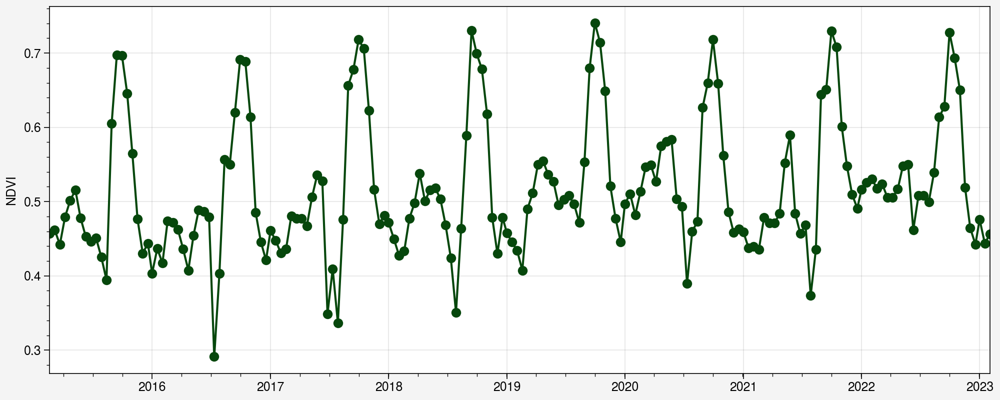

In [63]:
fig, ax = plot.subplots(figsize=(10, 4), tight=True)
ax.plot(m_ndvi.dataframe.index, m_ndvi.dataframe['NDVI'],
        color='forest green', marker='o')
plot.show()

In [64]:
m_evi = chart.Image.series(**{'imageCollection': scaled_evi,
                                   'region': kolkata,
                                   'reducer': ee.Reducer.mean(),
                                   'scale': 1000,
                                   'xProperty': 'system:time_start'})

m_evi.renderWidget(width='50%')

HTML(value='<embed src=data:image/svg+xml;charset=utf-8;base64,PD94bWwgdmVyc2lvbj0nMS4wJyBlbmNvZGluZz0ndXRmLTg…

### Displaying variation in EVI index over time for past 7 years

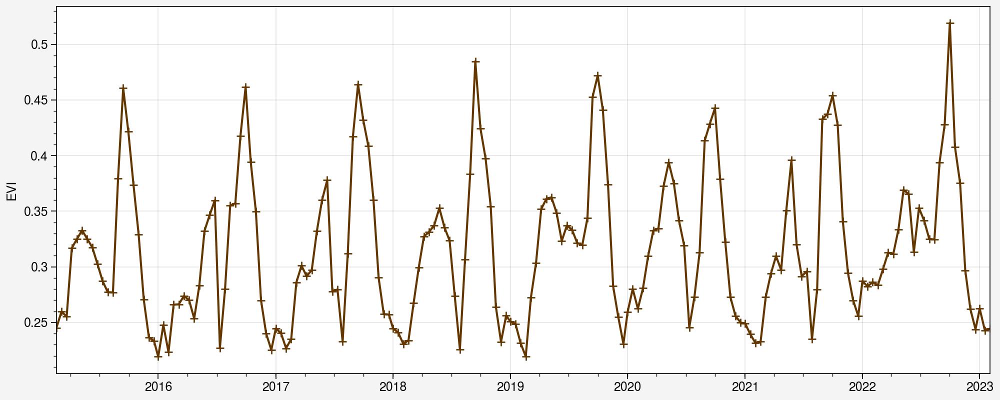

In [65]:
fig, ax = plot.subplots(figsize=(10, 4), tight=True)
ax.plot(m_evi.dataframe.index, m_evi.dataframe['EVI'],
        color='brown', marker='+')
plot.show()

In [66]:
# monthly averaging
m_evi_monthly = m_evi.dataframe.groupby(pd.Grouper(freq="M")).mean()
m_ndvi_monthly = m_ndvi.dataframe.groupby(pd.Grouper(freq="M")).mean()

###Displaying variation in EVI and NDVI indexes over time for past 7 years

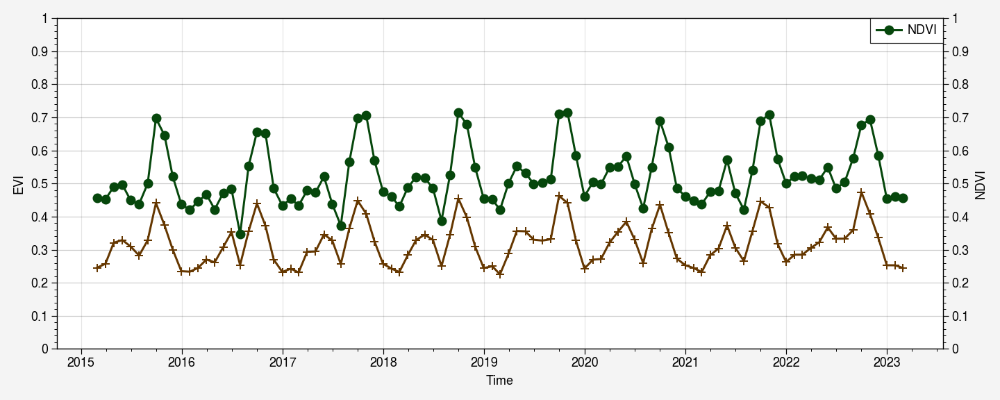

In [67]:
# time index
time = m_evi_monthly.index
# plot
fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()
# EVI
ax1.plot(time, m_evi_monthly, label='EVI',
         color='brown', marker='+')
# NDVI
ax2.plot(time, m_ndvi_monthly, label='NDVI',
         color='forest green', marker='o')
ax1.set_xlabel('Time')
ax1.set_ylabel('EVI')
ax2.set_ylabel('NDVI')
ax1.set_yticks(np.arange(0.0, 1.1, 0.1))
ax2.set_yticks(np.arange(0.0, 1.1, 0.1))
plt.legend()
plt.tight_layout()
plt.show()

#Lancover Analysis of Kolkata, India
---

Predicting landcover of KOlkata, India by performing supervised classification

### Adding landsat data to the map and clipping Maharashtra

In [68]:
Map = geemap.Map()

admin = ee.FeatureCollection("FAO/GAUL_SIMPLIFIED_500m/2015/level1");
kolkatya = admin.filter(ee.Filter.eq('ADM1_NAME', 'West Bengalk'))
geometry = kolkata.geometry()

point = ee.Geometry.Point([80.3288, 23.5121])

image = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED") \
    .filterDate('2023-01-01', '2023-12-31') \
    .sort('CLOUD_COVER') \
    .min() \
    .select('B[1-7]') \
    .clip(geometry)


vis_params = {
    'min': 0,
    'max': 3000,
    'bands': ['B5', 'B4', 'B3']
}

Map.centerObject(point, 5)
Map.addLayer(image, vis_params, "Sentinal 2a")


### Making the training dataset 
by selecting points in and around kolkata on MODIS landcover dataset. 
The selected points can bee seen on the generated map later by switching the layers.

In [69]:
modis = ee.ImageCollection('MODIS/006/MCD12Q1') \
              .filterDate('2016-01-01', '2023-01-01') \
              .select('LC_Type1') \
              .reduce(ee.Reducer.median())

points = modis.sample(**{
    'region': ee.Geometry.Rectangle([72.0000, 23.0000, 82.0000, 15.0000]),
    'scale': 30,
    'numPixels': 5000,
    'seed': 0,
    'geometries': True  # Set this to False to ignore geometries
})

Map.addLayer(points, {}, 'training', False)

print(points.size().getInfo())
print(points.first().getInfo())

5000
{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [75.96063229451673, 21.19164441922813]}, 'id': '0', 'properties': {'LC_Type1_median': 12}}


###Training the classifier
Here we will be using the smilecart classifier in this case

In [70]:
# Use these bands for prediction.
bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7']


# This property of the table stores the land cover labels.
label = 'LC_Type1_median'
input = image.select(bands)

# Overlay the points on the imagery to get training.
training = input.sampleRegions(**{
  'collection': points,
  'properties': [label],
  'scale': 30
})

# Train a CART classifier with default parameters.
trained = ee.Classifier.smileCart().train(training, label, bands)

print(training.first())

ee.Element({
  "functionInvocationValue": {
    "functionName": "Collection.first",
    "arguments": {
      "collection": {
        "functionInvocationValue": {
          "functionName": "Image.sampleRegions",
          "arguments": {
            "collection": {
              "functionInvocationValue": {
                "functionName": "Image.sample",
                "arguments": {
                  "geometries": {
                    "constantValue": true
                  },
                  "image": {
                    "functionInvocationValue": {
                      "functionName": "ImageCollection.reduce",
                      "arguments": {
                        "collection": {
                          "functionInvocationValue": {
                            "functionName": "Collection.map",
                            "arguments": {
                              "baseAlgorithm": {
                                "functionDefinitionValue": {
                            

###Classifying the image with the same bands used for training

In [71]:
result = image.select(bands).classify(trained)

###Adding MODIS layer to compare the result

In [72]:
landcover = ee.ImageCollection('MODIS/006/MCD12Q1') \
              .filterDate('2019-01-01', '2023-12-31') \
              .select('LC_Type1') \
              .reduce(ee.Reducer.mean()) \
              .clip(geometry)

LandCoverVis = {
  'min': 1.0,
  'max': 17.0,
  'palette': [
    '05450a', '086a10', '54a708', '78d203', '009900', 'c6b044', 'dcd159',
    'dade48', 'fbff13', 'b6ff05', '27ff87', 'c24f44', 'a5a5a5', 'ff6d4c',
    '69fff8', 'f9ffa4', '1c0dff'
  ],
}

Map.centerObject(point, 5)
Map.addLayer(landcover, LandCoverVis, 'MODIS Land Cover')

###Rendering categorical map and adding MODIS like legends in the result

In [73]:
landsatcover = result.set('classification_class_values', [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16])
landsatcover = landsatcover.set('classification_class_palette', ['1c0dff', '05450a', '086a10', '54a708', '78d203', '009900', 'c6b044', 'dcd159', 'dade48', 'fbff13', 'b6ff05', '27ff87', 'c24f44', 'a5a5a5', 'ff6d4c', '69fff8', 'f9ffa4',   ])
Map.addLayer(landsatcover, {}, 'Land cover')

EEException: No valid training data were found.

In [ ]:
ee_class_table = """

Value	Color	Description
0	1c0dff	Water
1	05450a	Evergreen needleleaf forest
2	086a10	Evergreen broadleaf forest
3	54a708	Deciduous needleleaf forest
4	78d203	Deciduous broadleaf forest
5	009900	Mixed forest
6	c6b044	Closed shrublands
7	dcd159	Open shrublands
8	dade48	Woody savannas
9	fbff13	Savannas
10	b6ff05	Grasslands
11	27ff87	Permanent wetlands
12	c24f44	Croplands
13	a5a5a5	Urban and built-up
14	ff6d4c	Cropland/natural vegetation mosaic
15	69fff8	Snow and ice
16	f9ffa4	Barren or sparsely vegetated
254	ffffff	Unclassified

"""

legend_dict = geemap.legend_from_ee(ee_class_table)
Map.add_legend(legend_title="Land Cover Legend", legend_dict=legend_dict)

**Steps to interpret and interact with the Map:**
1. The rendered map is pannable and zoomable, use it accordingly

2. Click on the globe icon (located top-left) to search and mark a specific location 

2.   Refer the legend to interpret the data presented on the map

3.   Click on the toolbar on the top-right corner and select layers to switch between layers (landsat8, training points, landcover(result), original MODIS for comparision and google maps). 

4.   Use the slider alongside to adjust the opacity



In [ ]:
Map

Map(center=[23.512099999999997, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

#Analysing Air Quality of kolkata
---
**Results shown for last month i.e, 2024-05-01 to 2024-05-30**

## NRTI/L3_AER_AI
This dataset provides near real-time high-resolution imagery of the UV Aerosol Index (UVAI), also called the Absorbing Aerosol Index (AAI).

The AAI is based on wavelength-dependent changes in Rayleigh scattering in the UV spectral range for a pair of wavelengths. The difference between observed and modelled reflectance results in the AAI. When the AAI is positive, it indicates the presence of UV-absorbing aerosols like dust and smoke. It is useful for tracking the evolution of episodic aerosol plumes from dust outbreaks, volcanic ash, and biomass burning.

The wavelengths used have very low ozone absorption, so unlike aerosol optical thickness measurements, AAI can be calculated in the presence of clouds. Daily global coverage is therefore possible.

For this L3 AER_AI product, the absorbing_aerosol_index is calculated with a pair of measurements at the 354 nm and 388 nm wavelengths.

https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_AER_AI?hl=en#bands

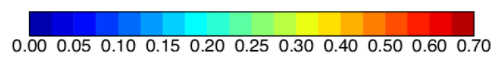

In [ ]:
Map2 = geemap.Map()

point = ee.Geometry.Point([80.3288, 23.5121])

absorbing_aerosol_index = ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_AER_AI') \
          .select('absorbing_aerosol_index') \
          .filterDate('2024-05-01', '2024-05-30')
#.filterDate('2018-07-10', '2021-11-19')

band_viz = {
  'min': -1,
  'max': 2.0,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
};

Map2.centerObject(point, 5)
Map2.addLayer(absorbing_aerosol_index.mean().clip(geometry), band_viz, "Sentinel-5P NRTI AER AI: Near Real-Time UV Aerosol Index")
#Map2.addLayer(absorbing_aerosol_index.mean(), band_viz, "Sentinel-5P NRTI AER AI: Near Real-Time UV Aerosol Index")

Map2

Map(center=[23.512099999999997, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

##NRTI/L3_CO
This dataset provides near real-time high-resolution imagery of CO concentrations.

Carbon monoxide (CO) is an important atmospheric trace gas for understanding tropospheric chemistry. In certain urban areas, it is a major atmospheric pollutant. Main sources of CO are combustion of fossil fuels, biomass burning, and atmospheric oxidation of methane and other hydrocarbons. Whereas fossil fuel combustion is the main source of CO at northern mid-latitudes, the oxidation of isoprene and biomass burning play an important role in the tropics. TROPOMI on the Sentinel 5 Precursor (S5P) satellite observes the CO global abundance exploiting clear-sky and cloudy-sky Earth radiance measurements in the 2.3 µm spectral range of the shortwave infrared (SWIR) part of the solar spectrum. TROPOMI clear sky observations provide CO total columns with sensitivity to the tropospheric boundary layer. For cloudy atmospheres, the column sensitivity changes according to the light path.

https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_CO#description

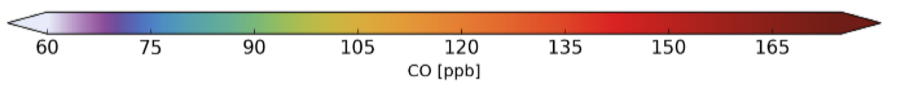


In [ ]:
Map3 = geemap.Map()

point = ee.Geometry.Point([80.3288, 23.5121])

carbon_monoxide = ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_CO') \
          .select('CO_column_number_density') \
          .filterDate('2024-05-01', '2024-05-30')

band_viz = {
  'min': 0,
  'max': 0.05,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
};

Map3.centerObject(point, 5)
Map3.addLayer(carbon_monoxide.mean().clip(geometry), band_viz, "Sentinel-5P NRTI CO: Near Real-Time Carbon Monoxide")
#Map3.addLayer(carbon_monoxide.mean(), band_viz, "Sentinel-5P NRTI CO: Near Real-Time Carbon Monoxide")

Map3

Map(center=[23.512099999999997, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

##NRTI/L3_NO2
This dataset provides near real-time high-resolution imagery of NO2 concentrations.

Nitrogen oxides (NO2 and NO) are important trace gases in the Earth’s atmosphere, present in both the troposphere and the stratosphere. They enter the atmosphere as a result of anthropogenic activities (notably fossil fuel combustion and biomass burning) and natural processes (wildfires, lightning, and microbiological processes in soils). Here, NO2 is used to represent concentrations of collective nitrogen oxides because during daytime, i.e. in the presence of sunlight, a photochemical cycle involving ozone (O3) converts NO into NO2 and vice versa on a timescale of minutes. The TROPOMI NO2 processing system is based on the algorithm developments for the DOMINO-2 product and for the EU QA4ECV NO2 reprocessed dataset for OMI, and has been adapted for TROPOMI. This retrieval-assimilation-modelling system uses the 3-dimensional global TM5-MP chemistry transport model at a resolution of 1x1 degree as an essential element

https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_NO2

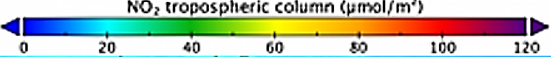



In [ ]:
Map4 = geemap.Map()

point = ee.Geometry.Point([80.3288, 23.5121])

nitrogen_dioxide = ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_NO2') \
          .select('NO2_column_number_density') \
          .filterDate('2024-05-01', '2024-05-30')

band_viz = {
  'min': 0,
  'max': 0.0002,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
};

Map4.centerObject(point, 5)
Map4.addLayer(nitrogen_dioxide.mean().clip(geometry), band_viz, "Sentinel-5P NRTI NO2: Near Real-Time Nitrogen Dioxide")
#Map4.addLayer(nitrogen_dioxide.mean(), band_viz, "Sentinel-5P NRTI NO2: Near Real-Time Nitrogen Dioxide")

Map4

Map(center=[23.512099999999997, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

##NRTI/L3_HCHO
This dataset provides near real-time high-resolution imagery of atmospheric formaldehyde (HCHO) concentrations.

Formaldehyde is an intermediate gas in almost all oxidation chains of non-methane volatile organic compounds (NMVOC), leading eventually to CO2. Non-Methane Volatile Organic Compounds (NMVOCs) are, together with NOx, CO and CH4, among the most important precursors of tropospheric O3. The major HCHO source in the remote atmosphere is CH4 oxidation. Over the continents, the oxidation of higher NMVOCs emitted from vegetation, fires, traffic and industrial sources results in important and localized enhancements of the HCHO levels. The seasonal and inter-annual variations of the formaldehyde distribution are principally related to temperature changes and fire events, but also to changes in anthropogenic activities. HCHO concentrations in the boundary layer can be directly related to the release of short-lived hydrocarbons, which mostly cannot be observed directly from space.

https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_HCHO

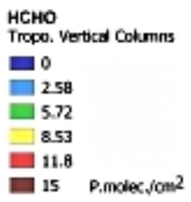


In [ ]:
Map5 = geemap.Map()

point = ee.Geometry.Point([80.3288, 23.5121])

Formaldehyde = ee.ImageCollection('COPERNICUS/S5P/NRTI/L3_HCHO') \
          .select('tropospheric_HCHO_column_number_density') \
          .filterDate('2024-05-01', '2024-05-30')

band_viz = {
  'min': 0.0,
  'max': 0.0003,
  'palette': ['black', 'blue', 'purple', 'cyan', 'green', 'yellow', 'red']
};


Map5.centerObject(point, 5)
Map5.addLayer(Formaldehyde.mean().clip(geometry), band_viz, "Sentinel-5P NRTI HCHO: Near Real-Time Formaldehyde")
#Map5.addLayer(Formaldehyde.mean(), band_viz, "Sentinel-5P NRTI HCHO: Near Real-Time Formaldehyde")

Map5

Map(center=[23.512099999999997, 80.3288], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…